In [1]:
# Initialize Otter
import otter
grader = otter.Notebook("Final Project Part 2.ipynb")

# Project - Part 2: Predicting Housing Prices in Cook County

## Due on Gradescope

## NO LATE SUBMISSIONS will be accepted - you must plan accordingly.

## Collaboration Policy

Please see the **Course Syllabus for the Collaboration Policy**.

On the other hand, the following are some **examples of things which would NOT usually be
considered to be cheating**:
 - Working on a HW problem on your own first and then discussing with a classmate a particular part in the problem solution where you are stuck.  After clarifying any questions you should then continue to write your solution independently.
 - Asking someone (or searching online) how a particular construct in the language works.
 - Asking someone (or searching online) how to formulate a particular construct in the language.
 - Asking someone for help in finding an error in your program.  
 - Asking someone why a particular construct does not work as you expected in a given program.
   

To test whether you are truly doing your own work and retaining what you've learned you should be able to easily reproduce from scratch and explain a HW solution that was your own when asked in office hours by an Instructor or on a quiz/exam.   


If you have difficulty in formulating the general solution to a problem on your own, or
you have difficulty in translating that general solution into a program, it is advisable to see
your instructor.

We are here to help!  Visit OH Hours and/or post questions on Piazza!


## Introduction

In Part 1 of this project, you performed some basic exploratory data analysis (EDA), laying out the thought process that leads to certain modeling decisions. Then, you added a few new features to the dataset, cleaning the data as well in the process.

In Part 2 of the project, you will specify and fit a linear model to a few features of the housing data to predict housing prices. Next, we will analyze the error of the model and brainstorm ways to improve the model's performance. Finally, we'll delve deeper into the implications of predictive modeling within the Cook County Assessor's Office (CCAO) case study, especially because statistical modeling is how the CCAO valuates properties. Given the history of racial discrimination in housing policy and property taxation in Cook County, consider the impacts of your modeling results as you work through this assignment - and think about what fairness might mean to property owners in Cook County.

After this part of the project, you should be comfortable with:
- Implementing a data processing pipeline using `pandas`
- Using `scikit-learn` to build and fit linear models

## Score Breakdown

Question | Manual | Points
----|----|----
1abd | Yes | 8
1c | No | 1
2a | Yes | 3
2b | No | 1
3 | No | 8
4 | No | 11
5 | Yes | 14
6 | Yes | 4
Total | | 50 | 32
Extra Credit| Yes| Up to +10

In [2]:
import numpy as np

import pandas as pd
from pandas.api.types import CategoricalDtype

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model as lm
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

import zipfile
import os

from ds100_utils import run_linear_regression_test

# Plot settings
plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.size'] = 12

Let's load the training and test data.

In [3]:
with zipfile.ZipFile('cook_county_data.zip') as item:
    item.extractall()

This dataset is split into a training/validation set and a testing set. Importantly, the test set does not contain values for our target variable, `Sale Price`. In this project, you will train a model on the training/validation set then use this model to predict the `Sale Price`s of the test set. In the cell below, we load the training/validation set into the `DataFrame` `training_val_data` and the test set into the `DataFrame` `test_data`.

In [4]:
training_val_data = pd.read_csv("cook_county_train_val.csv", index_col='Unnamed: 0')
test_data = pd.read_csv("cook_county_contest_test.csv", index_col='Unnamed: 0')

As a good sanity check, we should at least verify that the data shape matches the description.

In [5]:
# 204792 observations and 62 features in training data
assert training_val_data.shape == (204792, 62)
# 55311 observations and 61 features in test data
assert test_data.shape == (55311, 61)
# Sale Price is provided in the training/validation data
assert 'Sale Price' in training_val_data.columns.values
# Sale Price is hidden in the test data
assert 'Sale Price' not in test_data.columns.values

Let's remind ourselves of the data available to us in the Cook County dataset. Remember, a more detailed description of each variable is included in `codebook.txt`, which is in the same directory as this notebook). **If you did not attempt Project Part 1,** you should take some time to familiarize yourself with the codebook before moving forward.

In [6]:
training_val_data.columns.values

array(['PIN', 'Property Class', 'Neighborhood Code', 'Land Square Feet',
       'Town Code', 'Apartments', 'Wall Material', 'Roof Material',
       'Basement', 'Basement Finish', 'Central Heating', 'Other Heating',
       'Central Air', 'Fireplaces', 'Attic Type', 'Attic Finish',
       'Design Plan', 'Cathedral Ceiling', 'Construction Quality',
       'Site Desirability', 'Garage 1 Size', 'Garage 1 Material',
       'Garage 1 Attachment', 'Garage 1 Area', 'Garage 2 Size',
       'Garage 2 Material', 'Garage 2 Attachment', 'Garage 2 Area',
       'Porch', 'Other Improvements', 'Building Square Feet',
       'Repair Condition', 'Multi Code', 'Number of Commercial Units',
       'Estimate (Land)', 'Estimate (Building)', 'Deed No.', 'Sale Price',
       'Longitude', 'Latitude', 'Census Tract',
       'Multi Property Indicator', 'Modeling Group', 'Age', 'Use',
       "O'Hare Noise", 'Floodplain', 'Road Proximity', 'Sale Year',
       'Sale Quarter', 'Sale Half-Year', 'Sale Quarter of Year'

<!-- BEGIN QUESTION -->

<br/>
<hr style="border: 5px solid #003262;" />
<hr style="border: 1px solid #fdb515;" />

## Question 1: Human Context and Ethics

In this part of the project, we will explore the human context of our housing dataset.

**You should read the [Project_CaseStudy.pdf](https://canvas.colorado.edu/courses/95692/files/71805013?module_item_id=5035681) on Canvas explaining the context and history surrounding this dataset before attempting this section.**

<br>

--- 

### Question 1a
"How much is a house worth?" Who might be interested in an answer to this question? **Please list at least three different parties (people or organizations) and state whether each one has an interest in seeing the housing price to be high or low.**

Three examples of parties who might be interested in how much a house is worth are: Buyers, Sellers, and Members Of The Community of where the property may or may not be sold.

- **Buyers**: A buyer in this context could have mixed feelings about what interest they have in regards to the price of a house. More often than not, buyers are going to be hopeful that a house price is lower than it is higher.
- **Sellers**: Sellers are obviously going to want the housing price to be higher rather than lower. This is because they are more than likely wanting to gain as much capital from a sale as possible.
- **Members Of The Community**: Members of the community (like neighbors) are more than likely going to want housing prices to be higher than lower so that the homes that they own, are also worth more than less.

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 1b

Which of the following scenarios strike you as unfair and why? You can choose more than one. There is no single right answer, but you must explain your reasoning. Would you consider some of these scenarios more (or less) fair than others? Why?

A. A homeowner whose home is assessed at a higher price than it would sell for.  
B. A homeowner whose home is assessed at a lower price than it would sell for.  
C. An assessment process that systematically overvalues inexpensive properties and undervalues expensive properties.  
D. An assessment process that systematically undervalues inexpensive properties and overvalues expensive properties.


I first find scenario **B** to be unfair. If the price of the house is assessed as lower than what it would sell for, the homeowner could potentially lose money on the sale of the house. I find scenarios **C** and **D** to be both unfair because this process is systematically screwing over either buyers or sellers of the home. In one context, buyers may be purchasing a home for more than it is worth and in the other sellers may be getting less than what their home is worth. Both in my eyes are unfair.

<!-- END QUESTION -->

---

### Question 1c

Consider a model that is fit to $n = 50$ training observations. We denote the response as $y$ (Log Sale Price), the prediction as $\hat{y}$, and the corresponding residual to be $y - \hat{y}$. Which residual plot corresponds to a model that might make property assessments that result in regressive taxation? (Refer to the [Project_CaseStudy.pdf](https://canvas.colorado.edu/courses/95692/files/71805013?module_item_id=5035681) for a reminder of the definition of regressive taxation).  Assume that all three plots use the same vertical scale and that the horizontal line marks $y - \hat{y} = 0$. Assign `q1c` to the string letter corresponding to your plot choice.

**Hint:** When a model overvalues a property (predicts a `Sale Price` greater than the actual `Sale Price`), what are the relative sizes of $y$ and $\hat{y}$? What about when a model undervalues a property?

<img src='res_plots.png' width="900px" />


In [7]:
q1c = "A"

In [8]:
grader.check("q1c")

q1c results: All test cases passed!

## The CCAO Dataset

You'll work with the dataset from the Cook County Assessor's Office (CCAO) in Illinois. This government institution determines property taxes across most of Chicago's metropolitan areas and nearby suburbs. In the United States, all property owners must pay property taxes, which are then used to fund public services, including education, road maintenance, and sanitation. These property tax assessments are based on property values estimated using statistical models considering multiple factors, such as real estate value and construction cost.

This system, however, is not without flaws. In late 2017, a lawsuit was filed against the office of Cook County Assessor Joseph Berrios for producing "[racially discriminatory assessments and taxes](https://www.chicagotribune.com/politics/ct-cook-county-board-assessor-berrios-met-20170718-story.html)." The lawsuit included claims that the assessor's office undervalued high-priced homes and overvalued low-priced homes, creating a visible divide along racial lines: Wealthy homeowners, who were typically white, [paid less in property taxes](https://fix8media-chicago.squarespace.com/bpnc-v-berrios-resource-page), whereas [working-class, non-white homeowners paid more](https://www.chicagotribune.com/news/breaking/ct-cook-county-assessor-berrios-sued-met-20171214-story.html).

The Chicago Tribune's four-part series, "[The Tax Divide](https://www.chicagotribune.com/investigations/ct-tax-divide-investigation-20180425-storygallery.html)", delves into how this was uncovered: After "compiling and analyzing more than 100 million property tax records from the years 2003 through 2015, along with thousands of pages of documents, then vetting the findings with top experts in the field," they discovered that "residential assessments had been so far off the mark for so many years." You can read more about their investigation [here](https://apps.chicagotribune.com/news/watchdog/cook-county-property-tax-divide/assessments.html).

**You should read the [Project_CaseStudy.pdf](https://canvas.colorado.edu/courses/95692/files/71805013?module_item_id=5035681) explaining the history about this dataset before answering the following question.**

<!-- BEGIN QUESTION -->

### Question 1d

What were the central problems with the earlier property tax system in Cook County as reported by the Chicago Tribune ? And what were the primary causes of these problems? (Note: in addition to reading the paragraph above you will need to **read the [Project_CaseStudy.pdf](https://canvas.colorado.edu/courses/95692/files/71805013?module_item_id=5035681) explaining the context and history of this dataset  before answering this question).**

The Chicago Tribune reported that there was a regressive tax system for home values. Essentially, homes that were evaluated at a lower price were taxed at a higher rate than those that were evaluated at a higher price. This caused a problem because those who had a lower house evaluation were paying more in taxes (as a ratio) than those who had a higher house evaluation.

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

<br/>
<hr style="border: 5px solid #003262;" />
<hr style="border: 1px solid #fdb515;" />

## Question 2a:  More EDA

<br>

In good news you have already done a lot of EDA with this dataset in Project 1. 

Before fitting any model, we should check for any missing data and/or unusual outliers.

Since we're trying to predict `Sale Price`, we'll start with that field.

Examine the `Sale Price` column in the `training_val_data` DataFrame and answer the following questions:


 - 2ai).  Does the `Sale Price` data have any missing, N/A, negative or 0 values for the data?  If so, propose a way to handle this.

 - 2aii).  Does the `Sale Price` data have any unusually large outlier values?  If so, propose a cutoff to use for throwing out large outliers, and justify your reasoning).  

 - 2aiii).  Does the `Sale Price` data have any unusually small outlier values?  If so, propose a cutoff to use for throwing out small outliers, and justify your reasoning.  
 
 
Below are three cells.  The first is a Markdown cell for you to write up your responses to all 3 parts above.
The second two are code cells that are available for you to write code to explore the outliers and/or visualize the Sale Price data.

### Question 2abc answer cell:**

#### Part 2ai

From my inspection, `Sale Price` does not contain any N/A, negative, or 0 values for the data. If it did, we could filter the data frame to remove these values.

#### Part 2aii

Yes, `Sale Price` does have some large outliers in it. In fact, from my inspection, there are 33 homes in this data set that are or above the cutoff of $5,000,000. These are extreme outliers. We could filter the data in this set so that these outliers were removed, similar to if we had values that were invalid.

#### Part 2aiii

Similar to part ii of this problem, there are a wide number of sale prices in the `Sale Price` column that are at or below $500. Because these could create problems in the data set, we could filter them out so their effects were not felt as hard. Similar to part ii for the high outliers.

In [9]:
print(training_val_data[training_val_data['Sale Price'] >= 5000000])
# your code exploring Sale Price above this line

                   PIN  Property Class  Neighborhood Code  Land Square Feet  \
929      5214120120000             209                171      58500.000000   
3838    14333031660000             209                 12       4471.000000   
4657    17042100070000             209                 22       3762.000000   
7619    14333020690000             209                 12       4092.000000   
8043     9351120170000             278                150       5850.000000   
10657   14333020330000             208                 12       4092.000000   
10961    5274140030000             206                171      29100.000000   
19702    5172030380000             209                171      46174.000000   
30684   14331230470000             206                 12       6800.000000   
37835    5214030240000             209                171      51156.000000   
65436    5083030290000             209                171      38077.000000   
68886    5274040100000             204              

In [10]:
print(training_val_data[training_val_data['Sale Price'] <= 500])
# optional extra cell for exploring code

                   PIN  Property Class  Neighborhood Code  Land Square Feet  \
0       17294100610000             203                 50            2500.0   
5       19174010300000             203                380            4390.0   
14      21312250180000             202                100            2976.0   
20       3323080010000             203                 70            6500.0   
23       6171050140000             203                 11            9113.0   
...                ...             ...                ...               ...   
204757  16264040290000             202                115            3125.0   
204765  13174290110000             203                 90            4250.0   
204766  25051260290000             205                282            4404.0   
204773   3161170030000             278                 40            8750.0   
204782  23293040180000             208                 52           29848.0   

        Town Code  Apartments  Wall Material  Roof 

<!-- END QUESTION -->

**Pure Market Filter**

As you (hopefully) noticed, there are quite a few small values for the Sale Price of a home that don't make sense.  This can happen when someone sells a house to a relative for $\$1$ or some other price that is not reflective of the true market value.  There are also several extremely large outliers (houses that sold for more than $10 million) that don't accurately capture the true market value of a home.

It turns out, there's actually an indicator feature already available in the dataset to help filter out any sale transactions that aren't considered "Pure Market Transactions"  (for example, when someone sells a house to a relative for $\$1$, we don't consider that a transaction driven by the true market value of the house.

We'll use this indicator feature in the next section to remove non-market transactions before fitting our models.


### Question 2b

What are the max and min Sale Price values for the subset of data in the training_val dataset with the indicator `Pure Market Filter` = 1?



In [11]:
max_Sale_Price_filtered = int(training_val_data[training_val_data['Pure Market Filter'] == 1]["Sale Price"].max())

min_Sale_Price_filtered = int(training_val_data[training_val_data['Pure Market Filter'] == 1]["Sale Price"].min())

print(f"Min: {min_Sale_Price_filtered}, Max: {max_Sale_Price_filtered}")


Min: 10003, Max: 8490078


In [12]:
grader.check("q2d")

q2d results: All test cases passed!

<br/>
<hr style="border: 5px solid #003262;" />
<hr style="border: 1px solid #fdb515;" />

## Question 3: Fitting a Simple Linear Regression Model

In Part 1 of the project, you plotted the log-transformed Sale Price vs the log-transformed total area covered by the building (in square feet)  and saw there was a positive linear association.  Let's start the modeling process by fitting a simple linear regression model using this predictor.  

Our first model will take the form:

$$
\text{Log Sale Price} = \theta_0 + \theta_1 \cdot (\text{Log Building Square Feet})
$$



<br>

--- 

### Question 3a:  Training/Validation Split


The data has already been split into a training_val set and a test set.  Let's further split the training_val set into a training set and a validation set. We will use the training set to fit our model's parameters and the validation set to evaluate how well our model will perform on unseen data drawn from the same distribution. If we used all the data to fit our model, we would not have a way to estimate model performance on **unseen data** such as the test set in `cook_county_contest_test.csv`.

In the cell below, complete the function `train_val_split` that splits an input DataFrame `data` into two smaller `DataFrame`s named `train` and `validation`. Let `train` contain 80% of the data, and let `validation` contain the remaining 20%.  You should not be importing any additional libraries for this question. Your answer should use the variable `shuffled_indices` defined for you. Take a look at the `np.permutation` [documentation](https://numpy.org/doc/stable/reference/random/generated/numpy.random.permutation.html). You should only be using `NumPy` functions to generate randomness!

**Hint:** While there are multiple solutions, one way is to create two `NumPy` arrays named `train_indices` and `validation_indices` (or any variable names of your choice) that contain a *random* 80% and 20% of the indices, respectively. Then, use these arrays to index into `data` to create your final `train` and `validation` `DataFrame`s. To ensure that your code matches our solution, use the first 80% as the training set and the last 20% as the validation set. Remember, the values you use to partition `data` must be integers!

*The provided tests use the same random seed to check that you not only answered correctly but ended up with the same train/validation split as our reference implementation. Later testing is easier this way.*

In [13]:

def train_val_split(data):
    """ 
    Takes in a DataFrame `data` and randomly splits it into two smaller DataFrames 
    named `train` and `validation` with 80% and 20% of the data, respectively. 
    """
    data_len = data.shape[0]
    shuffled_indices = np.random.permutation(data_len)
    train_size = int(data_len * 0.8)
    train_indices = shuffled_indices[:train_size]
    validation_indices = shuffled_indices[train_size:]
    train = data.iloc[train_indices]
    validation = data.iloc[validation_indices]
    return train, validation

#This makes the train-test split in this section reproducible across different runs 
# of the notebook. DO NOT CHANGE THIS RANDOM SEED.
np.random.seed(1337)

train, valid = train_val_split(training_val_data)

display(train.head(5).index)
display(valid.head(5).index)


Index([130829, 193890, 30507, 91308, 131132], dtype='int64')

Index([50636, 82485, 193966, 160612, 7028], dtype='int64')

In [14]:
grader.check("q3a")

q3a results: All test cases passed!

<br>

--- 
## Modeling Step 1:  Feature Transformation

<br>

## Create a pipeline to process the data

It is time to prepare the training and validation data for the model we proposed above. 

In Project Part 1, you wrote a few functions that added features to the dataset. Instead of calling them manually one by one each time, it is best practice to encapsulate all of this feature engineering into one "pipeline" function. Defining and using a pipeline reduces all the feature engineering to just one function call and ensures that the same transformations are applied to all data.  



For an example of how to work with pipelines, we have processed model 1 for you using `process_data_m1` in the below cell. 



In particular the cell below completes the following steps:

  1. Creates a function `process_data_m1` to perform the following feature engineering:  
     - Removes rows in the dataset that have the indicator `Pure Market Filter`= 0 (these are outliers that are not representative of sales driven by the true housing market).
     - Applies log transformations to the `Sale Price` and the `Building Square Feet` columns to create two new columns, `Log Sale Price` and `Log Building Square Feet`.
     - Selects the columns and `Log Sale Price` , `Log Building Square Feet`
     - Outputs the transformed DataFrame
 
 2. Run `process_data_m1` separately on the training data and then the validation data.  Then output the design matrix $\mathbb{X}$ and the observed vector $\mathbb{Y}$ for both the training data and the validation data (save them in the variable names `X_train_m1`, `Y_train_m1`, `X_valid_m1`, `Y_valid_m1`). Note that $\mathbb{Y}$ refers to the transformed `Log Sale Price`, not the original `Sale Price`. **Your design matrix should be a `pandas` DataFrame and your observed vector should be a `pandas` Series.**.


In [15]:
# Just Run This Cell.   Make sure you understand what each part is doing - you will use this format when you expand the model


def process_data_m1(data):
    """ 
    Takes in a DataFrame `data` and performs data transformations and processing to use for Model 1
    """
    
    # Remove outliers
    data = data[data["Pure Market Filter"]==1]
    
    # Create Log Sale Price column
    data["Log Sale Price"] = np.log(data["Sale Price"])
    
    # Create Log Building Square Feet column
    data["Log Building Square Feet"] = np.log(data["Building Square Feet"])
    
    # Select columns for the model
    data = data[['Log Building Square Feet', 'Log Sale Price']]
    
    return data



# Process both the training and validation data 
processed_train_m1 = process_data_m1(train)

processed_val_m1 = process_data_m1(valid)


# Create X (dataframe) and Y (series) to input into model
X_train_m1 = processed_train_m1.drop(columns = "Log Sale Price")
Y_train_m1 = processed_train_m1["Log Sale Price"]

X_valid_m1 = processed_val_m1.drop(columns = "Log Sale Price")
Y_valid_m1 = processed_val_m1["Log Sale Price"]

# Take a look at the result
display(X_train_m1.head())
display(Y_train_m1.head())

display(X_valid_m1.head())
display(Y_valid_m1.head())


,Log Building Square Feet
130829,7.870166
193890,7.002156
30507,6.851185
91308,7.228388
131132,7.990915


130829    12.994530
193890    11.848683
30507     11.813030
91308     13.060488
131132    12.516861
Name: Log Sale Price, dtype: float64

,Log Building Square Feet
50636,7.310550
82485,7.325808
193966,7.090077
160612,7.281386
7028,7.118016


50636     11.682668
82485     12.820655
193966     9.825526
160612    12.468437
7028      12.254863
Name: Log Sale Price, dtype: float64

## Modeling Step 2:  Create a linear model

Next we'll use `sci-kit learn` to train the model.



### Question 3b


We first initialize a [`sklearn.linear_model.LinearRegression`](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html) object for our model. 

We set the `fit_intercept = True` to ensure that the linear model has a non-zero intercept.

Fill in the rest of the code below to fit the model using the training set and then output predictions for both the training and validation set.  

In [16]:
linear_model_m1 = lm.LinearRegression(fit_intercept=True)

linear_model_m1.fit(X_train_m1, Y_train_m1)

# Compute the predicted y values from linear model 1 (in units log sale price) using the training data and 
# again using the validation data:

Y_predict_train_m1 = linear_model_m1.predict(X_train_m1)

Y_predict_valid_m1 = linear_model_m1.predict(X_valid_m1)

In [17]:
grader.check("q3b")

q3b results: All test cases passed!

<br>


## Modeling Step 3:  Model Evaluation Using RMSE


We'll compare the performance of our models using the Root Mean Squared Error (RMSE) function.

$$RMSE = \sqrt{\dfrac{\sum_{\text{houses in the set}}(\text{actual price for house} - \text{predicted price for house})^2}{\text{number of houses}}}$$


### QUESTION 3c:

Complete the code below for the funtion RMSE:

In [18]:
def rmse(predicted, actual):
    """
    Calculates RMSE from actual and predicted values
    Input:
      predicted (1D array): vector of predicted/fitted values
      actual (1D array): vector of actual values
    Output:
      a float, the root-mean square error
    """
    return np.sqrt(np.mean(np.power(actual - predicted, 2)))

In [19]:
grader.check("q3c")

q3c results: All test cases passed!

### Keeping track of all the models.

In this notebook (and in life) we will want to keep track of all our models. 
For this part of the project you will be creating 3 different versions of the model.

In [20]:
# Just run this cell to create arrays to store the RMSE information from the models

model_names=["M1: log(bsqft)", "M2", "M3"]

# Create arrays where we can keep track of training and validation RMSE for each model

training_error_log = np.zeros(4)
validation_error_log = np.zeros(4)

training_error = np.zeros(4)
validation_error = np.zeros(4)

# Array to track cross validation errors average RMSE errors  

cv_error = np.zeros(4)


## QUESTION 3d:

In the cell below use your `rmse` function to calculate the training error and validation error for model 1.

Assign the RMSE of the predicted log sale prices and the actual log sale prices to the following variables: 

 `training_error_log[0]`  and    `validation_error_log[0]`

Since the target variable we are working with is log-transformed, it can also be beneficial to transform it back to its original form so we will have more context on how our model is performing when compared to actual housing prices.  In other words we want the RMSE **with regard to `Sale Price`**. Remember to exponentiate your predictions and response vectors before computing the RMSE using the `rmse` function and assign it to the following:

`training_error[0]` and    `validation_error[0]`


In [21]:
# Training and validation RMSE for the model (in units log sale price)

training_error_log[0] = rmse(Y_predict_train_m1, Y_train_m1)
validation_error_log[0] = rmse(Y_predict_valid_m1, Y_valid_m1)

# Training and validation RMSE for the model (in its original dollar values before the log transform)

y_train_pred_exp = np.exp(Y_predict_train_m1)
y_train_exp = np.exp(Y_train_m1)
y_val_pred_exp = np.exp(Y_predict_valid_m1)
y_val_exp = np.exp(Y_valid_m1)

training_error[0] = rmse(y_train_pred_exp, y_train_exp)
validation_error[0] = rmse(y_val_pred_exp, y_val_exp)


print("1st Model\nTraining RMSE (log): {}\nValidation RMSE (log): {}\n".format(training_error_log[0], validation_error_log[0]))
print("1st Model \nTraining RMSE: {}\nValidation RMSE: {}\n".format(training_error[0], validation_error[0]))


1st Model
Training RMSE (log): 0.7509790948543053
Validation RMSE (log): 0.7508998658616937

1st Model 
Training RMSE: 249895.90791758915
Validation RMSE: 255533.84041505



In [22]:
grader.check("q3d")

q3d results: All test cases passed!

## Modeling Step 4: Cross Validation

To check that the validation RMSE is representative of the dataset we'll also perform a 5-fold cross validation on the model.

In [23]:
# Just run this cell.  It uses 5-fold cross validation to check that our validation errors weren't a fluke.
# Make sure you understand what this code is doing, you will need it again when you update the model.

from sklearn.model_selection import KFold
from sklearn.base import clone

def cross_validate_rmse(model, X, y):
    model = clone(model)
    five_fold = KFold(n_splits=5) 
    de_logged_rmse_values = []
    for tr_ind, va_ind in five_fold.split(X):
        model.fit(X.iloc[tr_ind,:], y.iloc[tr_ind])
        de_logged_rmse_values.append(rmse(np.exp(y.iloc[va_ind]), np.exp(model.predict(X.iloc[va_ind,:]))))
    return np.mean(de_logged_rmse_values)


# Create a new model to fit on the whole training_val dataset
linear_model_m1_cv = lm.LinearRegression(fit_intercept=True)


# Process the entire training_val dataset using the pipeline
processed_full_m1 = process_data_m1(training_val_data)


# Split into X and Y:
X_full_m1 = processed_full_m1.drop(columns = "Log Sale Price")
Y_full_m1 = processed_full_m1["Log Sale Price"]

# DO NOT CHANGE THIS LINE - it ensures reproducibility 
np.random.seed(1330)

# Run Cross Validation and Output RMSE (in units of Sale Price):
cv_error[0] = cross_validate_rmse(linear_model_m1_cv, X_full_m1, Y_full_m1)
print("1st Model Cross Validation RMSE: {}".format(cv_error[0]))

1st Model Cross Validation RMSE: 250986.19718987434


## Modeling Step 5: Visualizations

## Visualizing RMSE

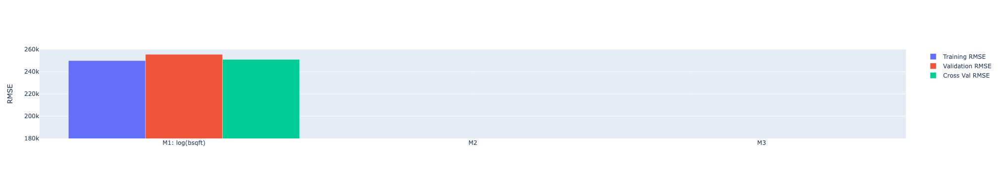

In [24]:
# Just run this cell.  It creates a visualization of the RMSE for Model 1

import plotly.graph_objects as go

fig = go.Figure([
go.Bar(x = model_names, y = training_error, name="Training RMSE"),
go.Bar(x = model_names, y = validation_error, name="Validation RMSE"),
go.Bar(x = model_names, y = cv_error, name="Cross Val RMSE")
])

fig.update_yaxes(range=[180000,260000], title="RMSE")

fig

Notice that our RMSE is pretty high given that it's in the units of dollars and measures our error when predicting sale prices of a house.  We will want to improve this model!

<br>

--- 

## Visualizing Residual Plots

Another way of understanding a model's performance (and appropriateness) is through a plot of the residuals versus the observations.  We will use the validation data to create these plots.

In the cells below, use [`plt.scatter`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.scatter.html) to plot
2 side-by-side residual plots:

 - The first plot should be of the residuals from predicting `Log Sale Price` using the model versus  the **predicted** `Log Sale Price` for the **validation data**. 
 - The second plot should be the residuals from predicting `Log Sale Price` using the model versus the **actual** `Log Sale Price` for the **validation data**. 

We will keep the residuals in terms of units of log to make it easier to spot trends.

With such a large dataset, it is difficult to avoid overplotting entirely. We set the dot size and opacity in the scatter plot to reduce the impact of overplotting as much as possible.

## QUESTION 3e:  Complete the code below to plot the residual plots

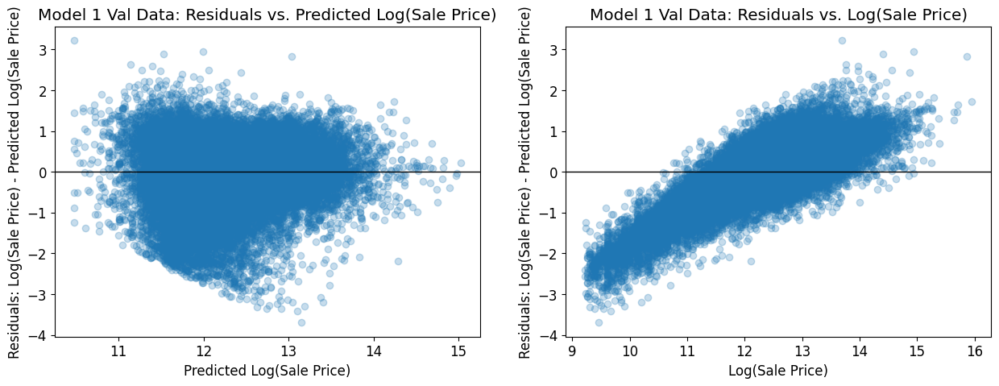

In [25]:
fig, ax = plt.subplots(1,2, figsize=(15, 5))

Y_valid_m1_array = Y_valid_m1.to_numpy(dtype=object)

x_plt1 = Y_predict_valid_m1
y_plt1 = Y_valid_m1_array - Y_predict_valid_m1

x_plt2 = Y_valid_m1_array
y_plt2 = y_plt1

ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("Model 1 Val Data: Residuals vs. Predicted Log(Sale Price)");

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("Model 1 Val Data: Residuals vs. Log(Sale Price)");

In [26]:
grader.check("q3e")

q3e results: All test cases passed!

**NOTE** Notice in the first plot it appears that the lower part of the plot is cutoff along an angled line - this is due to us filtering the data by only considering "Pure Market Filter" = 1, it is not a "pattern" in the residuals that we should try to address.

<br>


--- 

### Question 3f

Based on the structure you see in your residual plots, does this model seem like it will correspond to _regressive_, _fair_, or _progressive_ taxation?

Assign the string "regressive", "fair" or "progressive" to `q3f` in the cell below accordingly.

In [27]:
q3f = "regressive"

In [28]:
grader.check("q3f")

q3f results: All test cases passed!

<br/>
<hr style="border: 5px solid #003262;" />
<hr style="border: 1px solid #fdb515;" />

## Question 4:  Adding a New Feature


While our simple model explains some of the variability in price, there is certainly still a lot of room for improvement to be made -- one reason is we have been only utilizing 1 feature (out of a total of 60+) so far! 

### Choosing Candidate Predictors to Add to Model



To see if additional variables might be helpful, we can plot the residuals from the fitted model against a variable that is not in the model. If we see patterns, that indicates we might want to include this additional feature or a transformation of it. 

In Project Part 1, you conducted feature transformation to create several other features related to the Sale Price including `Bedrooms` and `Roof Material`.
Let's examine plots of the residuals from Model 1 vs each of these features.

We have automatically imported staff implementations of the functions you wrote in Project 1 (these are stored in `feature_func.py`).  You are welcome to copy over your own implementations from Project 1 if you'd prefer. 

These functions are:
 - `remove_outliers`, 
 - `add_total_bedrooms`, 
 - `find_expensive_neighborhoods`, 
 - `add_in_expensive_neighborhood`, and 
 - `ohe_roof_material`. 


In [29]:
# Just run this cell - it creates the columns of the 2 additional features we're interested in considering 
# and appends the residual data from Model 1, so we can easily visualize

from feature_func import *


def process_data_candidates(data):
    
    # Remove Non-Market Sales
    data = data[data["Pure Market Filter"]==1]
    
    data["Log Sale Price"] = np.log(data["Sale Price"])
    
    # Create Log Building Square Feet column
    data["Log Building Square Feet"] = np.log(data["Building Square Feet"])
    
    
    # Create Bedrooms
    data = add_total_bedrooms(data)


    # Update Roof Material feature with names
    data = substitute_roof_material(data)
    
    # Select columns for comparing residuals
    data = data[['Log Building Square Feet',  'Roof Material', 'Bedrooms', 'Log Sale Price']]

    return data


#Since our residuals are using the validation data, we will just examine these new features on the validation dataset
    
valid_comp = process_data_candidates(valid)
    
valid_comp = valid_comp.assign(M1residuals_log=Y_valid_m1 - Y_predict_valid_m1)


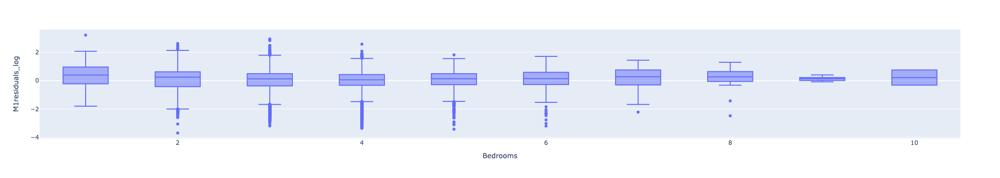

In [30]:
# Run this cell to compare residuals with Bedrooms

import plotly.express as px

px.box(valid_comp, x='Bedrooms', y='M1residuals_log')


Notice, the medians of each boxplot align pretty close to 0 on the y-axis (meaning there is no major trend in prediction errors by Number of Bedrooms).

This means we do NOT expect adding the features Bedrooms will help improve our original model.

What about Roof Material?


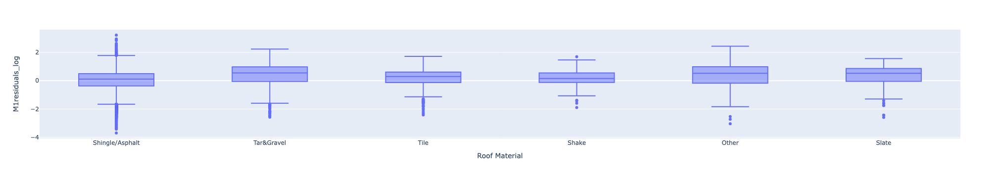

In [31]:
# Run this cell to compare residuals vs Roof Material

px.box(valid_comp, x='Roof Material', y='M1residuals_log')

The plot above shows us that the distribution of errors appears to change slightly based on Roof Material. Ideally, the median of each  box plot lines up with 0 on the y-axis (meaning there was no difference in prediction by Roof Material type). Instead, we see some variation from 0 for all except Shingle/Asphalt.   These patterns suggest that we may want to try including Roof Material in the model.


## Question 4a:  Model 2

Let's add `Roof Material` as a predictor in our model.  We will transform the column to be in terms of the Room Material names (like you did in Project Part 1, instead of the number codes).   In other words, let's consider a model of the form:

Model 2: 
$$
\text{Log Sale Price} =  \theta_1 (\text{Log Building Square Feet})  +\theta_2 (\text{Shingle/Asphalt})+ \theta_3 (\text{Tar\&Gravel})+ \theta_4  (\text{Tile})+ \theta_5 (\text{Shake})+  \theta_6(\text{Other})+  \theta_7(\text{Slate})
$$


**Note:** This will require one-hot-encoding Roof Material.  Notice since we're one-hot-encoding we don't need to include an extra intercept term in the model. 

In the cells below fill in the code to create and analyze Model 2 (follow the Modeling steps outlined in Question 3):  




In [32]:
# Modeling Step 1:  Process the Data

# Hint: You can either use your implementation of the One Hot Encoding Function from Project Part 1, or use the staff's implementation

from feature_func import *
from sklearn.preprocessing import OneHotEncoder

# Optional:  Define any helper functions you need for one-hot encoding above this line

def process_data_m2(data):
    # You should start by only keeping values with Pure Market Filter = 1
    data = data[data["Pure Market Filter"] == 1]
    data["Log Sale Price"] = np.log(data["Sale Price"])
    data["Log Building Square Feet"] = np.log(data["Building Square Feet"])
    data = substitute_roof_material(data)
    columns = ["Log Sale Price", "Log Building Square Feet", "Roof Material"]
    data = data[columns]
    data = ohe_roof_material(data)
    data = data.drop(columns = "Roof Material")
    return data

# Process the data for Model 2
processed_train_m2 = process_data_m2(train)

processed_val_m2 = process_data_m2(valid)


# Create X (dataframe) and Y (series) to use in the model
X_train_m2 = processed_train_m2.drop(columns = "Log Sale Price")
Y_train_m2 = processed_train_m2["Log Sale Price"]

X_valid_m2 = processed_val_m2.drop(columns = "Log Sale Price")
Y_valid_m2 = processed_val_m2["Log Sale Price"]


# Take a look at the result
display(X_train_m2.head())
display(Y_train_m2.head())

display(X_valid_m2.head())
display(Y_valid_m2.head())

,Log Building Square Feet,Roof Material_Other,Roof Material_Shake,Roof Material_Shingle/Asphalt,Roof Material_Slate,Roof Material_Tar&Gravel,Roof Material_Tile
130829,7.870166,0.0,0.0,1.0,0.0,0.0,0.0
193890,7.002156,0.0,0.0,1.0,0.0,0.0,0.0
30507,6.851185,0.0,0.0,1.0,0.0,0.0,0.0
91308,7.228388,0.0,0.0,1.0,0.0,0.0,0.0
131132,7.990915,0.0,0.0,1.0,0.0,0.0,0.0


130829    12.994530
193890    11.848683
30507     11.813030
91308     13.060488
131132    12.516861
Name: Log Sale Price, dtype: float64

,Log Building Square Feet,Roof Material_Other,Roof Material_Shake,Roof Material_Shingle/Asphalt,Roof Material_Slate,Roof Material_Tar&Gravel,Roof Material_Tile
50636,7.310550,0.0,0.0,1.0,0.0,0.0,0.0
82485,7.325808,0.0,0.0,1.0,0.0,0.0,0.0
193966,7.090077,0.0,0.0,1.0,0.0,0.0,0.0
160612,7.281386,0.0,0.0,1.0,0.0,0.0,0.0
7028,7.118016,0.0,0.0,1.0,0.0,0.0,0.0


50636     11.682668
82485     12.820655
193966     9.825526
160612    12.468437
7028      12.254863
Name: Log Sale Price, dtype: float64

In [33]:
# Modeling STEP 2:  Create a Multiple Linear Regression Model

# Be sure to set fit_intercept to False, since we are incorporating one-hot-encoded data

linear_model_m2 = lm.LinearRegression(fit_intercept = False)
linear_model_m2.fit(X_train_m2, Y_train_m2)

# your code above this line to create regression model for Model 2

Y_predict_train_m2 = linear_model_m2.predict(X_train_m2)

Y_predict_valid_m2 = linear_model_m2.predict(X_valid_m2)

In [34]:
# MODELING STEP 3:  Evaluate the RMSE for your model

# Training and test errors for the model (in its units of Log Sale Price)

training_error_log[1] = rmse(Y_predict_train_m2, Y_train_m2)
validation_error_log[1]= rmse(Y_predict_valid_m2, Y_valid_m2)

y_train_pred_exp = np.exp(Y_predict_train_m2)
y_train_exp = np.exp(Y_train_m2)
y_val_pred_exp = np.exp(Y_predict_valid_m2)
y_val_exp = np.exp(Y_valid_m2)

# Training and test errors for the model (in its original values before the log transform)
training_error[1] = rmse(y_train_pred_exp, y_train_exp)
validation_error[1] = rmse(y_val_pred_exp, y_val_exp)


print("2nd Model\nTraining RMSE (log): {}\nValidation RMSE (log): {}\n".format(training_error_log[1], validation_error_log[1]))
print("2nd Model \nTraining RMSE: {}\nValidation RMSE: {}\n".format(training_error[1], validation_error[1]))


2nd Model
Training RMSE (log): 0.7483802621374289
Validation RMSE (log): 0.748019915798399

2nd Model 
Training RMSE: 242236.36744014142
Validation RMSE: 247381.61240359474



In [35]:
# MODELING STEP 4:  Conduct 5-fold cross validation for model and output RMSE

linear_model_m2_cv = lm.LinearRegression(fit_intercept = False)

processed_full_m2 = process_data_m2(training_val_data)

X_full_m2 = processed_full_m2.drop(columns = "Log Sale Price")
Y_full_m2 = processed_full_m2['Log Sale Price']

# DO NOT CHANGE THIS LINE - it ensures reproducibility 
np.random.seed(1330)

# your code above this line to use 5-fold cross-validation and output RMSE (in units of dollars)

cv_error[1] = cross_validate_rmse(linear_model_m2_cv, X_full_m2, Y_full_m2)

print("2nd Model Cross Validation RMSE: {}".format(cv_error[1]))



2nd Model Cross Validation RMSE: 243124.9735886959


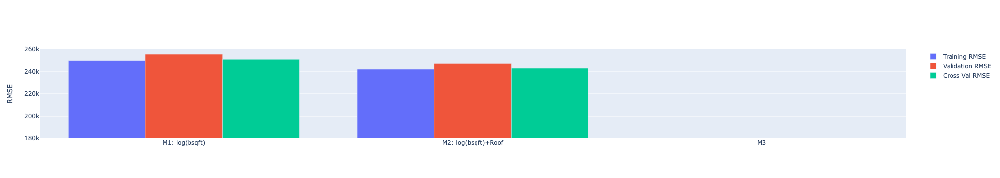

In [36]:
# MODELING STEP 5:  Just run this cell to Plot bar graph comparing RMSEs of Model 2 and Model 1 and side-by-side residuals

model_names[1] = "M2: log(bsqft)+Roof"

fig = go.Figure([
go.Bar(x = model_names, y = training_error, name="Training RMSE"),
go.Bar(x = model_names, y = validation_error, name="Validation RMSE"),
go.Bar(x = model_names, y = cv_error, name="Cross Val RMSE")
])

fig.update_yaxes(range=[180000,260000], title="RMSE")

fig


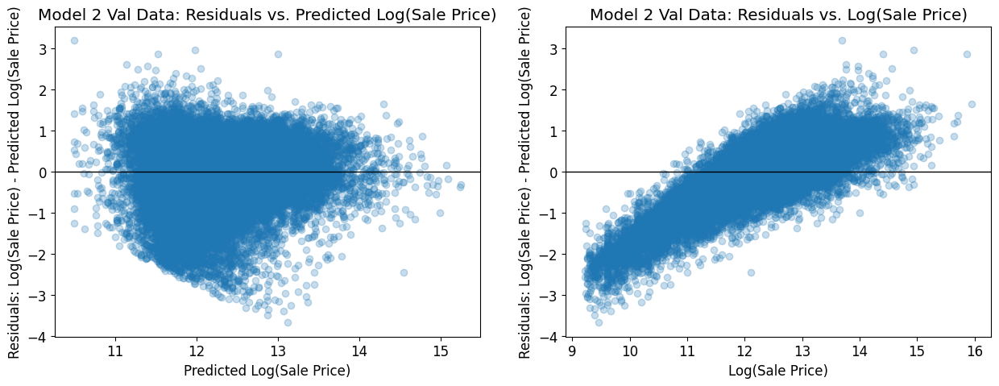

In [37]:
# MODELING STEP 5 cont'd:  Plot 2 side-by-side residual plots (similar to Question 3, for validation data)

fig, ax = plt.subplots(1,2, figsize=(15, 5))

Y_valid_m2_array = Y_valid_m2.to_numpy(dtype=object)

x_plt1 = Y_predict_valid_m2
y_plt1 = Y_valid_m2_array - Y_predict_valid_m2

x_plt2 = Y_valid_m2_array
y_plt2 = y_plt1


ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("Model 2 Val Data: Residuals vs. Predicted Log(Sale Price)");

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("Model 2 Val Data: Residuals vs. Log(Sale Price)");

In [38]:
grader.check("q4a")

q4a results: All test cases passed!

### Question 4b


We only see a slight decrease in the RMSE with this 2nd model, and our residuals look nearly the same as Model 1, even though the boxplots of Roof Material vs the residuals of Model 1 had indicated it might be a useful feature to add to the model.  

What went wrong?
  
Although there was variation in the boxplots we didn't check the number of data points actually in each different Roof Material Category, which will affect how useful the feature will be in reducing the RMSE.  

To see this, group the `valid_comp` data by Roof Material Type and calculate the proportion of data in each category.  

Set the variable `val_data_prop_roof_type` equal to a `series` with indices given by Roof Material Name and values that are the proportion of validation data of that roof type.

(for example `val_data_prop_roof_type["Shingle/Asphalt"]` should return a float that is the proportion of data points with that type of roof)

In [39]:
roof_material_counts = valid_comp["Roof Material"].value_counts()

total_valid_comp = len(valid_comp)

val_data_prop_roof_type = roof_material_counts / total_valid_comp

roof_material_mapping = {
    1: "Shingle/Asphalt",
    2: "Tar&Gravel",
    3: "Slate",
    4: "Shake",
    5: "Tile",
    6: "Other"
}

val_data_prop_roof_type = val_data_prop_roof_type.rename(index=roof_material_mapping)

val_data_prop_roof_type

Roof Material
Shingle/Asphalt    0.951513
Tar&Gravel         0.022723
Shake              0.009751
Tile               0.007067
Other              0.004711
Slate              0.004234
Name: count, dtype: float64

In [40]:
grader.check("q4b")

q4b results: All test cases passed!

<!-- BEGIN QUESTION -->


<br/>
<hr style="border: 1px solid #fdb515;" />

## Question 5:  Improving the Model



### Question 5a:  Choose an additional feature

It's your turn to choose another feature to add to the model.  Choose one new **quantitative** (not qualitative) feature and create Model 3 incorporating this feature (along with the features we've already chosen in Model 2).    Try to choose a feature that will have a large impact on reducing the RMSE and/or will improve your residual plots.  This can be a raw feature available in the dataset, or a transformation of one of the features in the dataset, or a new feature that you create from the dataset (see Project 1 for ideas).    In the cell below, explain what additional feature you have chosen and why.  Justify your reasoning.  There are optional code cells provided below for you to use when exploring the dataset to determine which feature to add. 

Note:  There is not one single right answer as to which feature to add, however you should make sure the feature decreases the Cross Validation RMSE compared to Model 2 (i.e. we want to improve the model, not make it worse!)  
This problem will be graded based on your reasoning and explanation of the feature you choose, and then on your implementation of incorporating the feature.   

**NOTE** Please don't add additional coding cells below or the Autograder will have issues.  You do not need to use all the coding cells provided. 

### Question 5a Answer Cell:   
In this cell, explain what feature you chose to add and why. Then give the equation for your new model (use Model 2 from above and then add an additional term).

The custom feature that I am choosing for this model is `Land Square Feet`. The reason why I am choosing this is because properties that have a larger amount of land with them tend to have a higher evaluation. On the contrary, properties that have less land tend to have a lower evaluation. Similar to model 2, I am going to add the log of this parameter to hopefully create a better model over all. The equation for this model will then look like

Model 3

\begin{align*}
\text{Log Sale Price} & =  \theta_1 (\text{Log Building Square Feet})  +\theta_2 (\text{Shingle/Asphalt})+ \theta_3 (\text{Tar\&Gravel})+ \theta_4  (\text{Tile}) \\
& + \theta_5 (\text{Shake})+  \theta_6(\text{Other})+  \theta_7(\text{Slate}) + \theta_8(\text{Log Land Square Feet})
\end{align*}

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 5b:  Create Model 3

In the cells below fill in the code to create and analyze Model 3 (follow the Modeling steps outlined in Questions 3 and 4).

PLEASE DO NOT ADD ANY ADDITIONAL CELLS IN THIS PROBLEM OR IT MIGHT MAKE THE AUTOGRADER FAIL

In [41]:
# Modeling Step 1:  Process the Data

# Hint: You can either use your implementation of the One Hot Encoding Function from Project Part 1, or use the staff's implementation

from feature_func import *


def process_data_m3(data):
    # You should start by only keeping values with Pure Market Filter = 1
    data = data[data["Pure Market Filter"] == 1]
    data = ohe_roof_material(data)
    data["Log Sale Price"] = np.log(data["Sale Price"])
    data["Log Building Square Feet"] = np.log(data["Building Square Feet"])
    data["Log Land Square Feet"] = np.log(data["Land Square Feet"])
    columns = ["Log Sale Price", "Log Building Square Feet", "Log Land Square Feet"]
    columns.extend([col for col in data if col.startswith('Roof Material_')])
    processed_data = data[columns]
    return processed_data

# Process the data for Model 3
processed_train_m3 = process_data_m3(train)

processed_val_m3 = process_data_m3(valid)

# Create X (Dataframe) and Y (series) to use to train the model
X_train_m3 = processed_train_m3.drop(columns = "Log Sale Price")
Y_train_m3 = processed_train_m3["Log Sale Price"]

X_valid_m3 = processed_val_m3.drop(columns = "Log Sale Price")
Y_valid_m3 = processed_val_m3["Log Sale Price"]


# Take a look at the result
display(X_train_m3.head())
display(Y_train_m3.head())

display(X_valid_m3.head())
display(Y_valid_m3.head())


,Log Building Square Feet,Log Land Square Feet,Roof Material_1.0,Roof Material_2.0,Roof Material_3.0,Roof Material_4.0,Roof Material_5.0,Roof Material_6.0
130829,7.870166,9.172846,1.0,0.0,0.0,0.0,0.0,0.0
193890,7.002156,8.338784,1.0,0.0,0.0,0.0,0.0,0.0
30507,6.851185,8.799662,1.0,0.0,0.0,0.0,0.0,0.0
91308,7.228388,7.721349,1.0,0.0,0.0,0.0,0.0,0.0
131132,7.990915,9.257224,1.0,0.0,0.0,0.0,0.0,0.0


130829    12.994530
193890    11.848683
30507     11.813030
91308     13.060488
131132    12.516861
Name: Log Sale Price, dtype: float64

,Log Building Square Feet,Log Land Square Feet,Roof Material_1.0,Roof Material_2.0,Roof Material_3.0,Roof Material_4.0,Roof Material_5.0,Roof Material_6.0
50636,7.310550,8.047190,1.0,0.0,0.0,0.0,0.0,0.0
82485,7.325808,8.509161,1.0,0.0,0.0,0.0,0.0,0.0
193966,7.090077,8.921057,1.0,0.0,0.0,0.0,0.0,0.0
160612,7.281386,9.462188,1.0,0.0,0.0,0.0,0.0,0.0
7028,7.118016,8.332789,1.0,0.0,0.0,0.0,0.0,0.0


50636     11.682668
82485     12.820655
193966     9.825526
160612    12.468437
7028      12.254863
Name: Log Sale Price, dtype: float64

In [42]:
# Modeling STEP 2:  Create a Multiple Linear Regression Model

# Be sure to set fit_intercept to False, since we are incorporating one-hot-encoded data

linear_model_m3 = lm.LinearRegression(fit_intercept = False)
linear_model_m3.fit(X_train_m3, Y_train_m3)

# your code above this line to create regression model for Model 2

Y_predict_train_m3 = linear_model_m3.predict(X_train_m3)

Y_predict_valid_m3 = linear_model_m3.predict(X_valid_m3)

In [43]:
# MODELING STEP 3:  Evaluate the RMSE for your model

# Training and test errors for the model (in its units of Log Sale Price)

training_error_log[2] = rmse(Y_predict_train_m3, Y_train_m3)
validation_error_log[2]= rmse(Y_predict_valid_m3, Y_valid_m3)

y_train_pred_exp = np.exp(Y_predict_train_m3)
y_train_exp = np.exp(Y_train_m3)
y_val_pred_exp = np.exp(Y_predict_valid_m3)
y_val_exp = np.exp(Y_valid_m3)

# Training and test errors for the model (in its original values before the log transform)
training_error[2] = rmse(y_train_pred_exp, y_train_exp)
validation_error[2] = rmse(y_val_pred_exp, y_val_exp)


print("3rd Model\nTraining RMSE (log): {}\nValidation RMSE (log): {}\n".format(training_error_log[2], validation_error_log[2]))
print("3rd Model \nTraining RMSE: {}\nValidation RMSE: {}\n".format(training_error[2], validation_error[2]))


3rd Model
Training RMSE (log): 0.7483197519746363
Validation RMSE (log): 0.7479270898764239

3rd Model 
Training RMSE: 241605.59600453379
Validation RMSE: 246604.11319280296



In [44]:
# MODELING STEP 4:  Conduct 5-fold cross validation for model and output RMSE

linear_model_m3_cv = lm.LinearRegression(fit_intercept = False)

processed_full_m3 = process_data_m3(training_val_data)

X_full_m3 = processed_full_m3.drop(columns = "Log Sale Price")
Y_full_m3 = processed_full_m3["Log Sale Price"]

# DO NOT CHANGE THIS LINE - it ensures reproducibility 
np.random.seed(1330)

# your code above this line to use 5-fold cross-validation and output RMSE (in units of dollars)

cv_error[2] = cross_validate_rmse(linear_model_m3_cv, X_full_m3, Y_full_m3)

print("3rd Model Cross Validation RMSE: {}".format(cv_error[2]))

3rd Model Cross Validation RMSE: 242424.8195489874


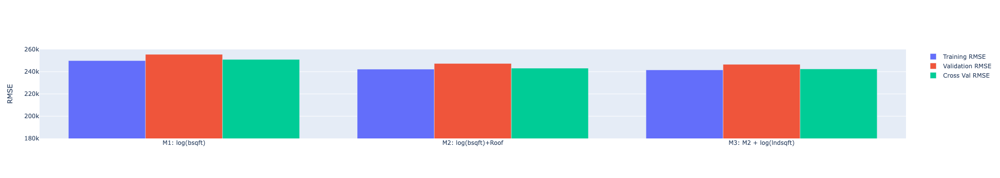

In [45]:
# MODELING STEP 5:  Add a name for your 3rd model describing the features and run this cell to Plot bar graph all 3 models

model_names[2] = "M3: M2 + log(lndsqft)"


fig = go.Figure([
go.Bar(x = model_names, y = training_error, name="Training RMSE"),
go.Bar(x = model_names, y = validation_error, name="Validation RMSE"),
go.Bar(x = model_names, y = cv_error, name="Cross Val RMSE")
])

fig.update_yaxes(range=[180000,260000], title="RMSE")

fig


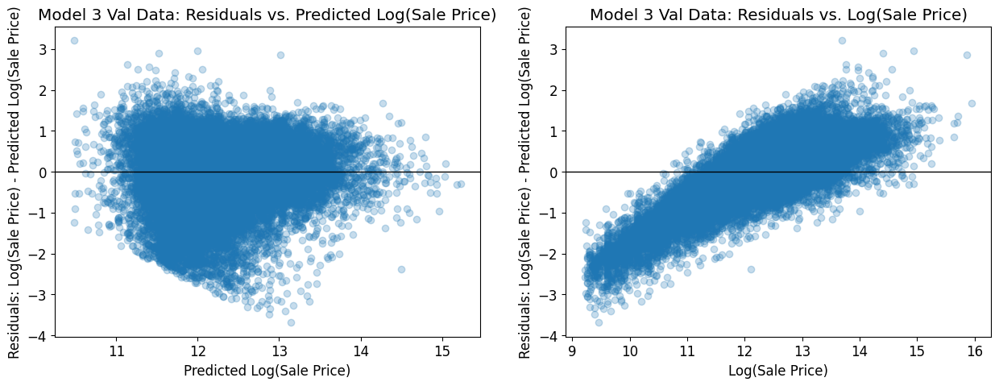

In [46]:
# MODELING STEP 5 cont'd:  Plot 2 side-by-side residual plots (similar to Question 3, for validation data)

fig, ax = plt.subplots(1,2, figsize=(15, 5))

Y_valid_m3_array = Y_valid_m3.to_numpy(dtype = object)

x_plt1 = Y_predict_valid_m3
y_plt1 = Y_valid_m3_array - Y_predict_valid_m3

x_plt2 = Y_valid_m3_array
y_plt2 = y_plt1


ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("Model 3 Val Data: Residuals vs. Predicted Log(Sale Price)");

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("Model 3 Val Data: Residuals vs. Log(Sale Price)");


<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 5c

i).  Comment on your RMSE and residual plots from Model 3 compared to the first 2 models.  

ii).  Are the residuals of your model still showing a trend that overestimates lower priced houses and underestimates higher priced houses?   If so, how could you try to address this in the next round of modeling?

iii).  If you had more time to improve your model, what would your next steps be?


#### Part i

The RMSE's of these models are as follows:

<center>

| Model Number | Training RMSE | Validation RMSE |
| ------------ | ------------- | --------------- |
| Model 1      | 249,895.91    | 255,533.84      |
| Model 2      | 242,236.37    | 247,381.61      |
| Model 3      | 241,605.60    | 246,604.11      |

</center>

We can see that the RMSE for my model is slightly better than that of model 2's for both the Training RMSE and the Validation RMSE. The residual plots for both the predicted log sale price and the valid log sale price are nearly identical to that of the previous two models. Indicating that my model is not much better than the previous model's.

#### Part ii

The residuals that are found in the prediction plot are showing a fair model in terms of tax systems. However, the plot of the actual log(Sale Price) are still indicating a regressive tax system. There are a number of ways that we could address this issue. Here are some possible solutions:

- We could add more features to try to more accurately predict the sale price of a property so that the residuals decrease in magnitude.
- We could add a weighted least squares regression, where the lower-priced properties are given more weight to try to counteract the regressive nature.

The easiest change we could make would be adding more features to the model.

#### Part iii

If I had more time, I would implement more features into my model. I believe this would decrease the RMSE significantly and produce a more accurate model because it is contingent upon more predictors to accurately place a price on a property.

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

<hr style="border: 1px solid #fdb515;" />

## Question 6: Evaluating the Model in Context

<br>

---
## Question 6a

When evaluating your model, we used RMSE. In the context of estimating the value of houses, what does the residual mean for an individual homeowner? How does it affect them in terms of property taxes? Discuss the cases where residual is positive and negative separately.

The residual for the homeowner is essentially the difference between the predicted Sale Price and the actual actual sale price. The RMSE is evaluating the difference of sale prices that are transformed with a logarithm, namely

$$
\text{Actual Log(Sale Price)} - \text{Predicted Log(Sale Price)}.
$$

When a residual is negative, the model is predicting a sale price that is higher than the actual sale price of the property. This disproportionately affects those who have a lower valued property because they will in turn pay more in taxes (in terms of total volume) than those with the opposite residual.

On the contrary, when a residual is positive the model is predicting a sale price that is lower than that of the actual sale price of the property. This in turn causes those who have higher valued property to pay less taxes (in volume) than those who have a lower valued property.

<!-- END QUESTION -->

In the case of the Cook County Assessor’s Office, Chief Data Officer Rob Ross states that fair property tax rates are contingent on whether property values are assessed accurately - that they’re valued at what they’re worth, relative to properties with similar characteristics. This implies that having a more accurate model results in fairer assessments. The goal of the property assessment process for the CCAO, then, is to be as accurate as possible. 

When the use of algorithms and statistical modeling has real-world consequences, we often refer to the idea of fairness as a measurement of how socially responsible our work is. Fairness is incredibly multifaceted: Is a fair model one that minimizes loss - one that generates accurate results? Is it one that utilizes "unbiased" data? Or is fairness a broader goal that takes historical contexts into account?

These approaches to fairness are not mutually exclusive. If we look beyond error functions and technical measures of accuracy, we'd not only consider _individual_ cases of fairness, but also what fairness - and justice - means to marginalized communities on a broader scale. We'd ask: What does it mean when homes in predominantly Black and Hispanic communities in Cook County are consistently overvalued, resulting in proportionally higher property taxes? When the white neighborhoods in Cook County are consistently undervalued, resulting in proportionally lower property taxes? 

Having "accurate" predictions doesn't necessarily address larger historical trends and inequities, and fairness in property assessments in taxes works beyond the CCAO's valuation model. Disassociating accurate predictions from a fair system is vital to approaching justice at multiple levels. Take Evanston, IL - a suburb in Cook County - as an example of housing equity beyond just improving a property valuation model: Their City Council members [recently approved reparations for African American residents](https://www.usnews.com/news/health-news/articles/2021-03-23/chicago-suburb-approves-government-reparations-for-black-residents).

<!-- BEGIN QUESTION -->

<br>

---

## Question 6b

Reflecting back on your exploration in Questions 5 and 6a, in your own words, what makes a model's predictions of property values for tax assessment purposes "fair"? 

This question is open-ended and part of your answer may depend upon your specific model; we are looking for thoughtfulness and engagement with the material, not correctness. 

**Hint:** Some guiding questions to reflect on as you answer the question above: What is the relationship between RMSE, accuracy, and fairness as you have defined it? Is a model with a low RMSE necessarily accurate? Is a model with a low RMSE necessarily "fair"? Is there any difference between your answers to the previous two questions? And if so, why?

In my opinion, a model's predictions of property values that would be considered fair is a model that is as accurate as possible. Consequently this would mean a model with a lower RMSE would mean that it is more fair than one that had a higher RMSE. If we are seeking to create a system that is fair across the board, then accuracy should be of our highest concerns. It is not fair to undervalue those who have a lower valued property and then overvalue those who have a higher valued property, because we are essentially instilling a system in which that has a bias towards those who have a higher valued property.

I firmly believe if we are seeking to be fair, we should aim to create a system where there are as little biases as possible. Those who are more fortunate than others should not be penalized than those who are less fortunate, in my personal opinion. 

To create a model that is fair for tax assessment purposes, we should seek to create a model that is as accurate as possible. Decreasing residuals and the RMSE of these models is the numerical way of achieving this.

<!-- END QUESTION -->

<hr style="border: 1px solid #fdb515;" />

## Extra Credit:  How Low Can You Go?   Create Your Own Model and Check RMSE on the Test Data

<br>

---



For **extra credit**, you can create your own model to try to improve the RMSE and residual plots even further.    

The tables below provide scoring guidelines for the extra credit opportunity in this problem. 
If your RMSE lies in a particular range, you will receive the number of points associated with that range.



### Extra Credit Grading Scheme

**Important**: while your Validation RMSE can be checked at any time in this notebook, your Test RMSE can only be checked once by submitting your model’s predictions to Gradescope. The thresholds are as follows:

Extra Credit Points | +5 | +4 | +3  | +2 | + 1
--- | --- | --- | --- | --- | ---
Validation RMSE | Less than 200k | [200k, 210k) | [210k, 220k) | [220k, 230k)  | [230k, 235k)

Extra Credit Points | +5 | +4 | +3  | +2 | + 1
--- | --- | --- | --- | --- | ---
Test RMSE | Less than 200k | [200k, 210k) | [210k, 220k) | [220k, 230k)| [230k, 235k)

<br><br>

To receive these points, you need to show your work in the cells below AND complete the EXPLANATION STEP at the end (explaining what you did to create your model).  

You ALSO MUST UPLOAD your test prediction .csv to the **"Project 2 Extra Credit Test Predictions"** assignment in Gradescope to receive extra credit for your test predictions.

---



## Some notes before you start

- **If you are running into memory issues, restart the kernel and only run the cells you need to.**   If needed you can use the commented cell below (question cell) that contains most to all of the imports necessary to successfully complete this portion of the project, so it can be completed independently code-wise from the remainder of the project, and you do not need to rerun the cell at the top of this notebook. The autograder will have more than 4GB of memory, so you will not lose credit as long as your solution to this question is within the total memory (4GB) limits of DataHub. By default, we reset the memory and clear all variables using `%reset -f`. If you want to delete specific variables, you may also use `del` in place of `%reset -f%`. For example, the following code will free up memory from data used for older models: `del training_val_data, test_data, train, validation, X_train_m1, X_valid_m1, X_train_m2, X_valid_m1`. Our staff solution can be run independently from all other questions, so we encourage you to do the same to make debugging easier.
- To avoid memory issues, you do not need to include cross validation for this step.  Your score will be based on the Validation Data set RMSE and the Test dataset RMSE.
- **Note: If you need the data again after deleting the variables or resetting, you must reload them again.**
- You will be predicting `Log Sale Price` on the data stored in `cook_county_contest_test.csv`. We will delog/exponentiate your prediction on Gradescope to compute RMSE and use this to score your model. Before submitting to Gradescope, make sure that your predicted values can all be delogged (i.e., if one of your `Log Sale Price` predictions is 60, it is too large; $e^{60}$ is too big!)
- You MUST remove any additional new cells you add before submitting to Gradescope to avoid any autograder errors. 


**PLEASE READ THE ABOVE MESSAGE CAREFULLY!**

**Hints:** 
- Some features may have missing values in the test set but not in the training set (especially if you're one-hot-encoding). Make sure `process_data_ec` handles missing values appropriately for each feature!



In [47]:

# Optional code cell for additional work exploring data/ explaining which feature you chose.
# You can add additional code cells directly below this if needed.

In [48]:

# Optional code cell for additional work exploring data/ explaining which feature you chose.

In [49]:
#Optional cell to try if you're having memory issues (i.e. if kernel keeps dying)


# If you're having memory issues, uncomment the lines below to clean up memory from previous questions and reinitialize Otter!



# MAKE SURE TO RECOMMENT THE NEXT 3 LINES OUT BEFORE SUBMITTING!

#%reset -f
#import otter
#grader = otter.Notebook("ProjPart2.ipynb")


#import numpy as np
#import pandas as pd
#from pandas.api.types import CategoricalDtype

#%matplotlib inline
#import matplotlib.pyplot as plt
#import seaborn as sns
#from sklearn import linear_model as lm

#import warnings
#warnings.filterwarnings("ignore")

#import zipfile
#import os

#import plotly.graph_objects as go

#from ds100_utils import *
#from feature_func import *




training_val_data = pd.read_csv("cook_county_train_val.csv", index_col='Unnamed: 0')
test_data = pd.read_csv("cook_county_contest_test.csv", index_col='Unnamed: 0')

# COPY THESE FUNCTIONS FROM ABOVE

def rmse(predicted, actual):
    """
    Calculates RMSE from actual and predicted values
    Input:
      predicted (1D array): vector of predicted/fitted values
      actual (1D array): vector of actual values
    Output:
      a float, the root-mean square error
    """
    return np.sqrt(np.mean(np.power(actual - predicted, 2)))

def train_val_split(data):
    """ 
    Takes in a DataFrame `data` and randomly splits it into two smaller DataFrames 
    named `train` and `validation` with 80% and 20% of the data, respectively. 
    """
    data_len = data.shape[0]
    shuffled_indices = np.random.permutation(data_len)
    train_size = int(data_len * 0.8)
    train_indices = shuffled_indices[:train_size]
    validation_indices = shuffled_indices[train_size:]
    train = data.iloc[train_indices]
    validation = data.iloc[validation_indices]
    return train, validation

# This makes the train-test split in this section reproducible across different runs of the notebook. DO NOT CHANGE THIS RANDOM SEED.
np.random.seed(1337)

train, valid = train_val_split(training_val_data)


<!-- BEGIN QUESTION -->

## Extra Credit Step 1: Creating Your Model
Complete the modeling steps (you can skip the cross validation step to save memory) in the cells below.

DO NOT ADD ANY EXTRA CELLS BELOW (for this part of the problem)

In [50]:
# Modeling Step 1:  Process the Data

# Hint: You can either use your implementation of the One Hot Encoding Function from Project Part 1, or use the staff's implementation
#from feature_func import *

# Optional:  Define any helper functions you need for one-hot encoding above this line

def add_total_rooms(data):
    """
    Input: data (data frame): a data frame containing at least the Description column.
    """
    rooms_regex = r'(\d+) rooms,'
    rooms = data['Description'].str.extract(rooms_regex).astype(int)
    data['Rooms'] = rooms
    return data

def polynomial_feature(data, feature, power):
    data[f"{feature} Polynomial"] = np.power(data[feature], power)
    return data

def process_data_ec(data, is_test_set=False):
    # Please include all of your feature engineering processes for both 
    # the training/validation as well as the test data inside this function.
    data = ohe_roof_material(data)
    data = add_total_rooms(data)
    data = polynomial_feature(data, "Town Code", 2)
    data = polynomial_feature(data, "Basement", 3)
    data = polynomial_feature(data, "Central Air", 2)
    data = polynomial_feature(data, "Fireplaces", 3)
    data = polynomial_feature(data, "Cathedral Ceiling", 3)
    data = polynomial_feature(data, "Multi Code", 2)
    data = polynomial_feature(data, "Census Tract", 2)
    data["Log Building Square Feet"] = np.log(data["Building Square Feet"])
    data["Log Estimate (Building)"] = np.log(data["Estimate (Building)"] != float('inf'))
    data["Log Estimate (Land)"] = np.log(data["Estimate (Land)"] != float('inf'))
    columns = [
        "Log Building Square Feet",
        "Log Estimate (Building)",
        "Log Estimate (Land)",
        "Land Square Feet",
        "Town Code",
        "Town Code Polynomial",
        "Basement",
        "Basement Polynomial",
        "Basement Finish",
        "Central Air",
        "Central Air Polynomial",
        "Fireplaces",
        "Fireplaces Polynomial",
        "Cathedral Ceiling",
        "Cathedral Ceiling Polynomial",
        "Site Desirability",
        "Other Improvements",
        "Multi Code",
        "Multi Code Polynomial",
        "Census Tract",
        "Census Tract Polynomial",
        "Town and Neighborhood",
        "Rooms",
        "Lot Size"
    ]
    columns.extend([col for col in data if col.startswith('Roof Material_')])
    # Can include feature engineering processes for both the training/validation 
    # and the test data above this line
    # Whenever you access 'Log Sale Price' or 'Sale Price', make sure to use the
    # condition is_test_set like this:
    if not is_test_set:
        # Processing for the training/validation set (i.e. not the test set)
        # CAN involve references to sale price!
        # CAN involve filtering certain rows or removing outliers
        data = data[data["Pure Market Filter"]==1]
        data = data[data["Number of Commercial Units"]==0]
        data['Log Sale Price'] = np.log(data['Sale Price'])
        columns.append("Log Sale Price")
        # Include the rest of your feature engineering processes for the 
        # training/validation set above this line
    else:
        # Processing for the test set
        # CANNOT involve references to sale price!
        # CANNOT involve removing any rows
        assert test_data.shape[0] == 55311
    return data[columns]

# Process the data 
processed_train_ec = process_data_ec(train, is_test_set=False)
processed_val_ec = process_data_ec(valid, is_test_set=False)

X_train_ec = processed_train_ec.drop(columns = "Log Sale Price")
Y_train_ec = processed_train_ec["Log Sale Price"]

X_valid_ec = processed_val_ec.drop(columns = "Log Sale Price")
Y_valid_ec = processed_val_ec["Log Sale Price"]

# Take a look at the result
display(X_train_ec.head())
display(Y_train_ec.head())

display(X_valid_m3.head())
display(Y_valid_m3.head())



,Log Building Square Feet,Log Estimate (Building),Log Estimate (Land),Land Square Feet,Town Code,Town Code Polynomial,Basement,Basement Polynomial,Basement Finish,Central Air,...,Census Tract Polynomial,Town and Neighborhood,Rooms,Lot Size,Roof Material_1.0,Roof Material_2.0,Roof Material_3.0,Roof Material_4.0,Roof Material_5.0,Roof Material_6.0
130829,7.870166,0.0,0.0,9632.0,38,1444,1.0,1.0,3.0,1.0,...,6.441748e+11,3845,8,9632.0,1.0,0.0,0.0,0.0,0.0,0.0
193890,7.002156,0.0,0.0,4183.0,72,5184,2.0,8.0,3.0,0.0,...,2.407865e+11,72330,4,4183.0,1.0,0.0,0.0,0.0,0.0,0.0
30507,6.851185,0.0,0.0,6632.0,31,961,1.0,1.0,1.0,1.0,...,6.663457e+11,3141,4,6632.0,1.0,0.0,0.0,0.0,0.0,0.0
91308,7.228388,0.0,0.0,2256.0,77,5929,1.0,1.0,3.0,1.0,...,5.904900e+10,77120,5,2256.0,1.0,0.0,0.0,0.0,0.0,0.0
131132,7.990915,0.0,0.0,10480.0,13,169,3.0,27.0,3.0,1.0,...,6.811234e+11,13182,8,10480.0,1.0,0.0,0.0,0.0,0.0,0.0


130829    12.994530
193890    11.848683
30507     11.813030
91308     13.060488
131132    12.516861
Name: Log Sale Price, dtype: float64

,Log Building Square Feet,Log Land Square Feet,Roof Material_1.0,Roof Material_2.0,Roof Material_3.0,Roof Material_4.0,Roof Material_5.0,Roof Material_6.0
50636,7.310550,8.047190,1.0,0.0,0.0,0.0,0.0,0.0
82485,7.325808,8.509161,1.0,0.0,0.0,0.0,0.0,0.0
193966,7.090077,8.921057,1.0,0.0,0.0,0.0,0.0,0.0
160612,7.281386,9.462188,1.0,0.0,0.0,0.0,0.0,0.0
7028,7.118016,8.332789,1.0,0.0,0.0,0.0,0.0,0.0


50636     11.682668
82485     12.820655
193966     9.825526
160612    12.468437
7028      12.254863
Name: Log Sale Price, dtype: float64

In [51]:
# Modeling STEP 2:  Create a Multiple Linear Regression Model

# If you are are incorporating one-hot-encoded data, set the fit_intercept to False

linear_model_ec = lm.LinearRegression(fit_intercept = False)
linear_model_ec.fit(X_train_ec, Y_train_ec)

# your code above this line to create regression model for Model 2

Y_predict_train_ec = linear_model_ec.predict(X_train_ec)

Y_predict_valid_ec = linear_model_ec.predict(X_valid_ec)

In [52]:
# MODELING STEP 3:  Evaluate the RMSE for your model

training_error_log = rmse(Y_predict_train_ec, Y_train_ec)
validation_error_log = rmse(Y_predict_valid_ec, Y_valid_ec)

y_train_pred_exp = np.exp(Y_predict_train_ec)
y_train_exp = np.exp(Y_train_ec)
y_val_pred_exp = np.exp(Y_predict_valid_ec)
y_val_exp = np.exp(Y_valid_ec)

# Training and test errors for the model (in its original values before the log transform)
training_error_ec = rmse(y_train_pred_exp, y_train_exp)
validation_error_ec = rmse(y_val_pred_exp, y_val_exp)

print("Extra Credit Model\nTraining RMSE (log): {}\nValidation RMSE (log): {}\n".format(training_error_log, validation_error_log))
print("Extra Credit \nTraining RMSE: {}\nValidation RMSE: {}\n".format(training_error_ec, validation_error_ec))


Extra Credit Model
Training RMSE (log): 0.6875751101720305
Validation RMSE (log): 0.6875361628489552

Extra Credit 
Training RMSE: 212211.2974452848
Validation RMSE: 216450.72735293876



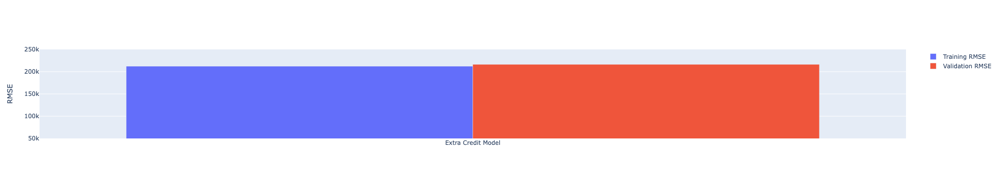

In [53]:
# Optional: Run this cell to visualize

fig = go.Figure([
go.Bar(x = ["Extra Credit Model"], y = [training_error_ec], name="Training RMSE"),
go.Bar(x = ["Extra Credit Model"], y = [validation_error_ec], name="Validation RMSE"),

])


fig
fig.update_yaxes(range=[50000,250000], title="RMSE")


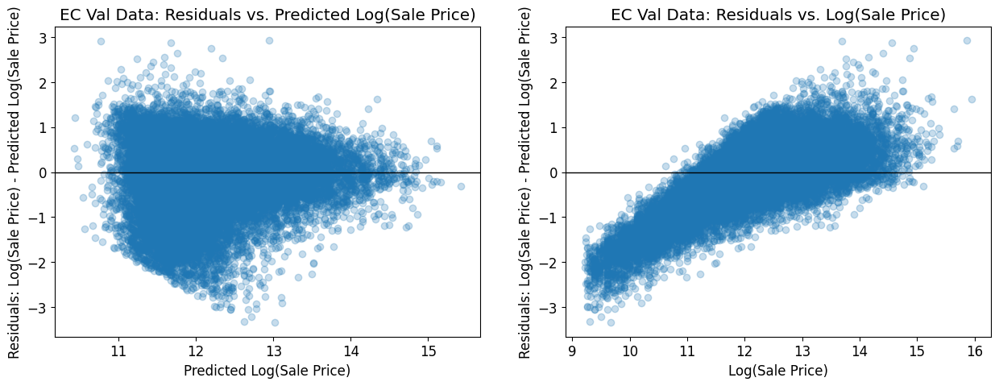

In [54]:
# MODELING STEP 5: Plot 2 side-by-side residual plots for validation data

Y_valid_ec_array = Y_valid_ec.to_numpy(dtype = object)

fig, ax = plt.subplots(1,2, figsize=(15, 5))


x_plt1 = Y_predict_valid_ec
y_plt1 = Y_valid_ec_array - Y_predict_valid_ec

x_plt2 = Y_valid_ec_array
y_plt2 = y_plt1


ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("EC Val Data: Residuals vs. Predicted Log(Sale Price)");

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("EC Val Data: Residuals vs. Log(Sale Price)");


<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

## Extra Credit Step 2:  Explanation (Required for points on model above):

Explain what you did to create your model.  What versions did you try?  What worked and what didn't? 

Comment on the RMSE and residual plots from your model.   Are the residuals of your model still showing a trend that overestimates lower priced houses and underestimates higher priced houses? 


For starters, I added as many features to my model as possible. I then went and transformed some of these features by turning them into polynomial features or by taking the logarithm of them. In the training aspect of this model I filtered out as many outliers as I possibly could. Coupling this together, I was able to get the RMSE down to around $\approx 215k$. In turn, the residuals for these outliers decreased in both directions and it appears that my model is doing a pretty good job at predicting house prices.

<!-- END QUESTION -->

## Extra Credit Step 3: Create and Submit Test Set Predictions to Gradescope

Now it's time to test your model on the actual test set.  You are only allowed to submit to Gradescope once, so wait until you have the best version of your model.    

The test data is in the dataframe `test_data`.  

Process the test data and run it through your model. Store your predictions from the test_data in the variable `Y_test_pred`.  These should be in units Log Sale Price (you do not need to exponentiate them).  

Then run the cell provided below to create a .csv file to store your predictions on the test set and submit this .csv to the Gradescope Assignment: **"Project 2 Extra Credit Test Predictions"**. 
Note that **you will not receive credit for the test set predictions (i.e. up to 10 points) unless you submit your.csv to the Gradescope assignment**!


In [55]:
# Cells to process test_data and run the model on it.  You CAN add any additional cells below
# Note: You can't remove any test_data cells.

processed_train_test = process_data_ec(test_data, is_test_set=True)

In [56]:
#Store your predictions for the test set in Y_test_pred (these should be in units of Log Sale Price)
Y_test_pred = linear_model_ec.predict(processed_train_test)

In [57]:
# Run this file to create the .csv of your predictions for the test set to upload to the assignment in Gradescope labeled Project 2 Extra Credit Test Predictions to have it checked.

from datetime import datetime

#Store your predictions for the test set in Y_test_pred (these should be in units of Log Sale Price)


# Construct and save the submission:
submission_df = pd.DataFrame({
    "Id": pd.read_csv('cook_county_contest_test.csv')['Unnamed: 0'], 
    "Value": Y_test_pred,
}, columns=['Id', 'Value'])
timestamp = datetime.isoformat(datetime.now()).split(".")[0]
submission_df.to_csv("submission_{}.csv".format(timestamp), index=False)

print('Created a CSV file: {}.'.format("submission_{}.csv".format(timestamp)))
print('You MUST now upload this CSV file to the Gradescope assignment "Project 2 Extra Credit Test Predictions" for scoring.')

Created a CSV file: submission_2024-05-03T02:19:49.csv.
You MUST now upload this CSV file to the Gradescope assignment "Project 2 Extra Credit Test Predictions" for scoring.


## Congratulations! You have finished the Project - Part 2


If you discussed this assignment with any other students in the class (in a manner that is acceptable as described by the Collaboration policy above) please **include their names** here:

**Collaborators**: *list collaborators here*

### Submission Instructions

Before proceeding any further, **save this notebook.**

After running the `grader.export()` cell provided below, **2 files will be created**: a zip file and pdf file.  You can download them using the links provided below OR by finding them in the same folder where this juptyer notebook resides in your JuptyerHub.

To receive credit on this assignment, **you must submit BOTH of these files
to their respective Gradescope portals:** 

* **Project Part 2 Autograded**: Submit the zip file that is output by the `grader.export()` cell below to the Autograded assignment in Gradescope.

* **Project Part 2 Manually Graded**: Submit your ProjectPart2.PDF to the  Manually Graded assignment in Gradescope.  **YOU MUST SELECT THE PAGES CORRESPONDING TO EACH QUESTION WHEN YOU UPLOAD TO GRADESCOPE.  IF NOT, YOU WILL LOSE POINTS**   Also, **check** that all of your plots **and** all lines of your code are showing up in your PDF before submitting.  If not, you will not receive credit for your plots/code.  

* **Extra Credit Submission**:  If you completed the extra credit, to receive credit for the Test Case prediction you must submit your Test Case prediction.csv (generated in the last cell of the extra credit section) to the Gradescope assignment titled "Project 2 Extra Credit Test Predictions"

**You are responsible for ensuring your submission follows our requirements. We will not be granting regrade requests nor extensions to submissions that don't follow instructions.** If you encounter any difficulties with submission, please don't hesitate to reach out to staff prior to the deadline.

## Submission

Make sure you have run all cells in your notebook in order before running the cell below, so that all images/graphs appear in the output. The cell below will generate a zip file for you to submit. **Please save before exporting!**

AFTER running the cell below, click on <a href='ProjPart2.pdf' download>this link to download the PDF </a> to upload to Gradescope.  There will be a separate link that appears after running the cell below with a link to download the zip file to upload to Gradescope.

In [58]:
# Save your notebook first, then run this cell to export your submission.
grader.export(run_tests=True)

Running your submission against local test cases...



Your submission received the following results when run against available test cases:

    q1c results: All test cases passed!

    q2d results: All test cases passed!

    q3a results: All test cases passed!

    q3b results: All test cases passed!

    q3c results: All test cases passed!

    q3d results: All test cases passed!

    q3e results: All test cases passed!

    q3f results: All test cases passed!

    q4a results: All test cases passed!

    q4b results: All test cases passed!
